nbviewer.jupyter.org/format/slides/gist/leechanwoo/

In [1]:
from IPython.display import Image

# Deep Learning Day 5.

## Scenario 1. Recurrent Neural Network
 * Generating Data
 * Building Model
   - RNN structure
   - Mechanism

### Building Model

 * Reccurent Neural Network(RNN)를 이용한 시계열 데이터 처리
 * Neural Network를 이용한 Memory 개념 등장
 * Neural Network에서 time step이 더해진 3차원 모델

$$ s_t = tanh(w_ix_t + w_ss_{t-1} + b)$$
$$ o_t = w_os_t$$

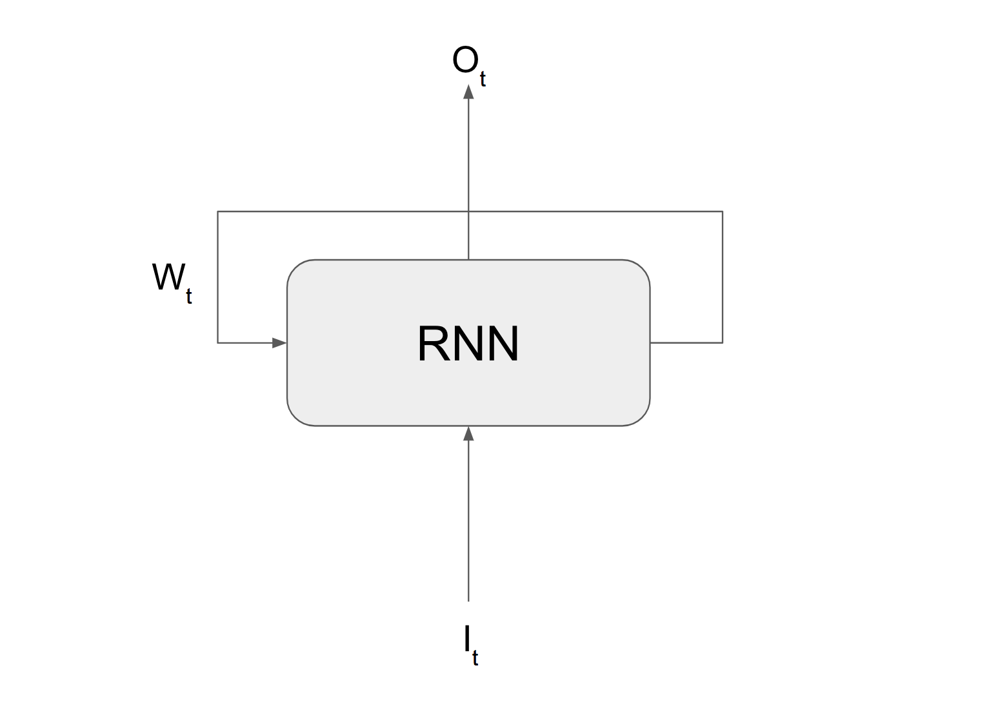

In [2]:
Image('./day5/rnn_structure.png')

#### RNN structure

 - Neural Network 모델에서 State 추가
 - activation function으로 tanh 사용
 - 각각 다른 state에서 weight들은 모두 공유한다는 것이 특징

#### Activation function
 * sigmoid function과 비슷한 개형
 * 실수 구간에서 -1 ~ 1까지의 값을 가짐
 * 상대적으로 CNN보다 Vanishing Gradient 문제가 일어나기 쉬움

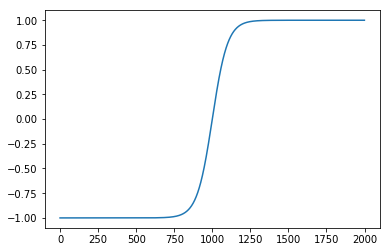

In [6]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

x = [float(i)*0.01 for i in range(-1000, 1000)]
tanh = np.tanh(x)
plt.plot(tanh)
plt.show()

#### Structure

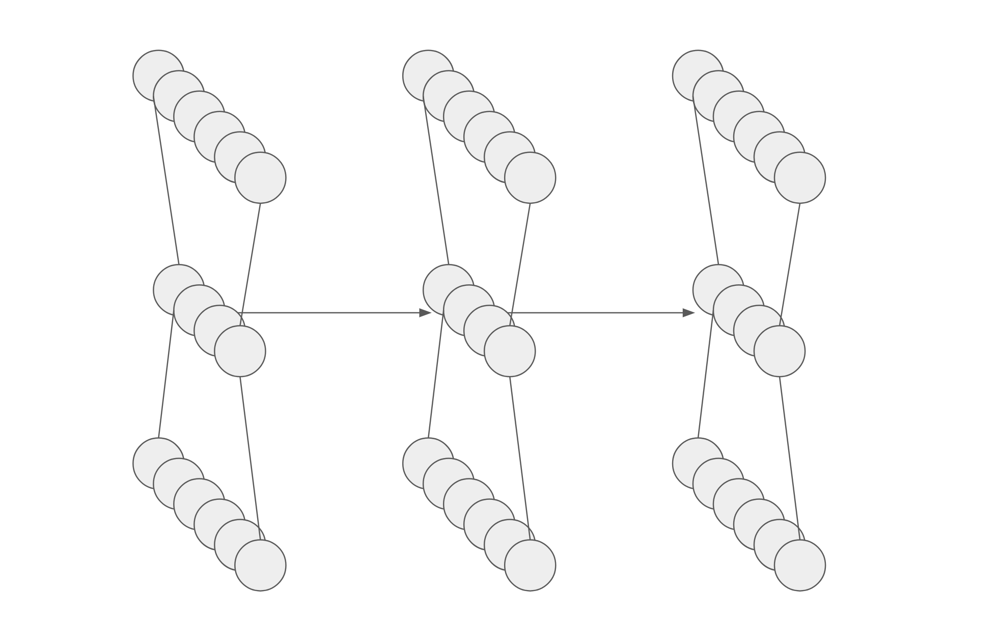

In [3]:
Image('./day5/rnn3d.png')

#### Mechanism

 * state를 가진 Neural Network가 각 state에 input 정보를 기억
 * input weight에서 input의 state 반영 정도를 학습
 * state weight에서 현재 상태에 대한 이전 상태의 영향(dependency: 종속성)을 학습
 * 아래 그림에서 tanh 생략

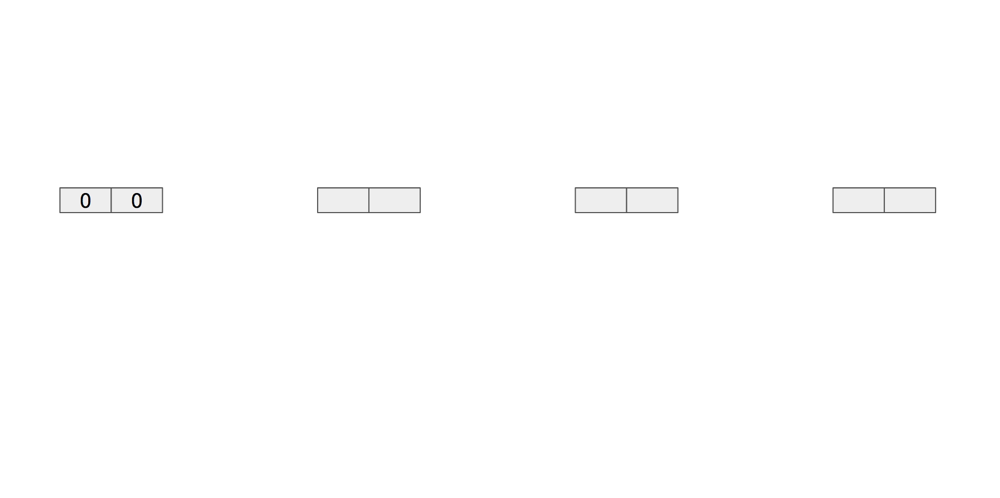

In [9]:
Image('./day5/rnn_mechanism.gif.png')

### Generating Data
 * sin(x)를 인풋, sin(x+1)을 라벨로 하는 데이터 생성
 * time step으로 나누어 Batch 생성
 * time step 별로 list로 나눔

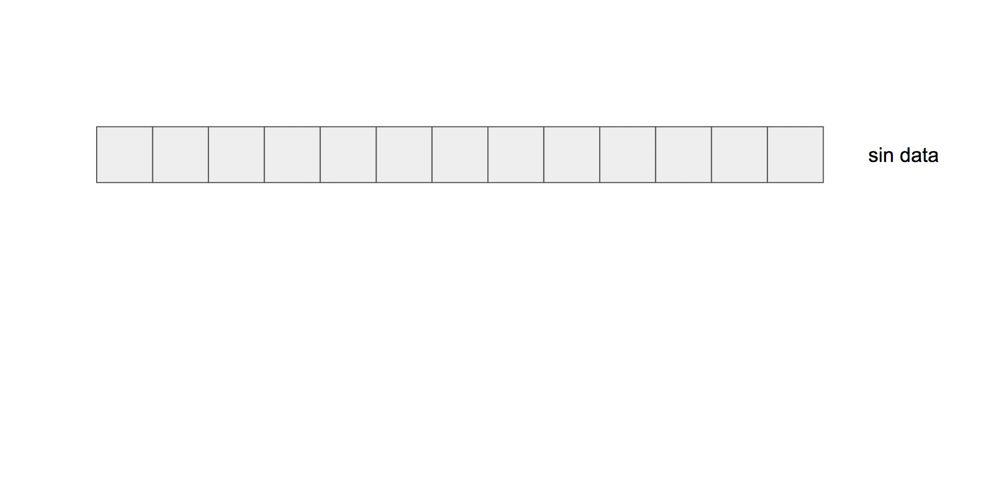

In [7]:
Image('./day5/batching.gif.png')

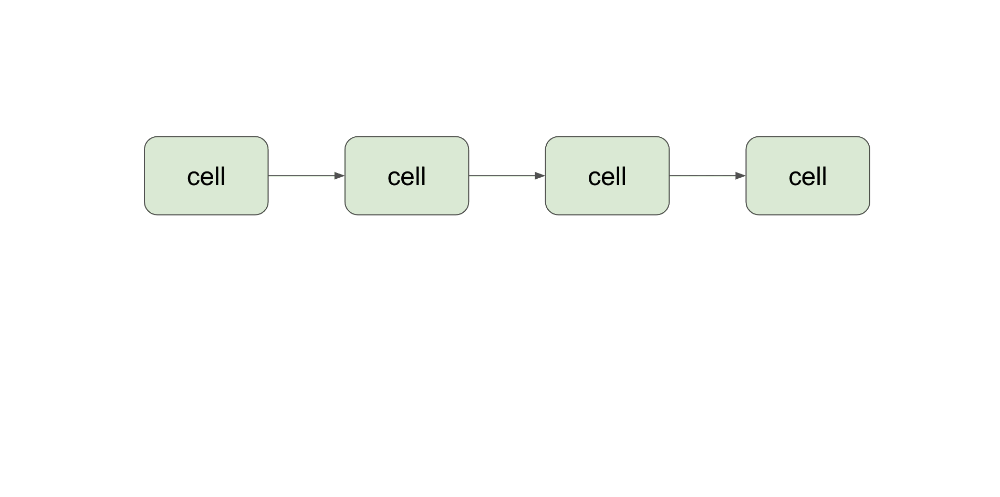

In [8]:
Image('./day5/input_batch.gif.png')

### Practice 1. Sin Tracker

In [11]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

[ 0.          0.00999983  0.01999867] [-0.53200348 -0.5235096  -0.51496337]
[ 0.00999983  0.01999867  0.0299955 ] [-0.5235096  -0.51496337 -0.50636564]


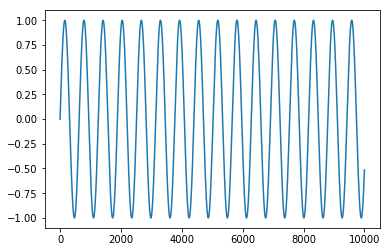

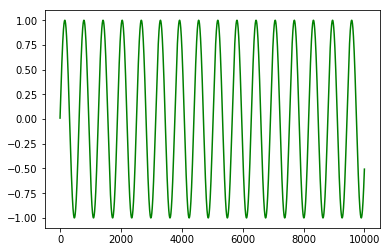

In [16]:
tf.reset_default_graph()

t = np.array([float(i)*0.01 for i in range(10000+1)])
sin = np.sin(t[:-1])
sin_next = np.sin(t[1:])

print_summaries = 3
print(sin[:print_summaries], sin[-print_summaries:])
print(sin_next[:print_summaries], sin_next[-print_summaries:])

plt.figure(1)
plt.plot(sin)
plt.figure(2)
plt.plot(sin_next, color='g')
plt.show()

In [17]:
time_step = 100
reshaped_sin = np.reshape(sin, [-1, time_step, 1])
reshaped_sin_next = np.reshape(sin_next, [-1, 1])

signal = tf.placeholder(tf.float32, [None, time_step, 1])
signal_next = tf.placeholder(tf.float32, [None, 1])

inputs = tf.unstack(signal, axis=1)
for i, _input in enumerate(inputs):
    print('unstacked input {} shape {}'.format(i, _input.shape))

unstacked input 0 shape (?, 1)
unstacked input 1 shape (?, 1)
unstacked input 2 shape (?, 1)
unstacked input 3 shape (?, 1)
unstacked input 4 shape (?, 1)
unstacked input 5 shape (?, 1)
unstacked input 6 shape (?, 1)
unstacked input 7 shape (?, 1)
unstacked input 8 shape (?, 1)
unstacked input 9 shape (?, 1)
unstacked input 10 shape (?, 1)
unstacked input 11 shape (?, 1)
unstacked input 12 shape (?, 1)
unstacked input 13 shape (?, 1)
unstacked input 14 shape (?, 1)
unstacked input 15 shape (?, 1)
unstacked input 16 shape (?, 1)
unstacked input 17 shape (?, 1)
unstacked input 18 shape (?, 1)
unstacked input 19 shape (?, 1)
unstacked input 20 shape (?, 1)
unstacked input 21 shape (?, 1)
unstacked input 22 shape (?, 1)
unstacked input 23 shape (?, 1)
unstacked input 24 shape (?, 1)
unstacked input 25 shape (?, 1)
unstacked input 26 shape (?, 1)
unstacked input 27 shape (?, 1)
unstacked input 28 shape (?, 1)
unstacked input 29 shape (?, 1)
unstacked input 30 shape (?, 1)
unstacked input 31

In [18]:
rnn_cell = tf.nn.rnn_cell.BasicRNNCell(10)
outputs, state = tf.nn.static_rnn(rnn_cell, inputs, dtype=tf.float32)

for i, _output in enumerate(outputs):
    print('rnn output {} shape {}'.format(i, _output.shape))

reshaped_outputs = tf.reshape(tf.stack(outputs, axis=1), [-1, 10])

print('stacked and reshaped rnn output {}'.format(reshaped_outputs.shape))

out = tf.layers.dense(reshaped_outputs, 1, use_bias=False)

print('output {}'.format(out.shape))

loss = tf.losses.mean_squared_error(signal_next, out)
train_op = tf.train.GradientDescentOptimizer(1e-2).minimize(loss)

rnn output 0 shape (?, 10)
rnn output 1 shape (?, 10)
rnn output 2 shape (?, 10)
rnn output 3 shape (?, 10)
rnn output 4 shape (?, 10)
rnn output 5 shape (?, 10)
rnn output 6 shape (?, 10)
rnn output 7 shape (?, 10)
rnn output 8 shape (?, 10)
rnn output 9 shape (?, 10)
rnn output 10 shape (?, 10)
rnn output 11 shape (?, 10)
rnn output 12 shape (?, 10)
rnn output 13 shape (?, 10)
rnn output 14 shape (?, 10)
rnn output 15 shape (?, 10)
rnn output 16 shape (?, 10)
rnn output 17 shape (?, 10)
rnn output 18 shape (?, 10)
rnn output 19 shape (?, 10)
rnn output 20 shape (?, 10)
rnn output 21 shape (?, 10)
rnn output 22 shape (?, 10)
rnn output 23 shape (?, 10)
rnn output 24 shape (?, 10)
rnn output 25 shape (?, 10)
rnn output 26 shape (?, 10)
rnn output 27 shape (?, 10)
rnn output 28 shape (?, 10)
rnn output 29 shape (?, 10)
rnn output 30 shape (?, 10)
rnn output 31 shape (?, 10)
rnn output 32 shape (?, 10)
rnn output 33 shape (?, 10)
rnn output 34 shape (?, 10)
rnn output 35 shape (?, 10)
rn

step: 0, loss: 0.40227705240249634
step: 100, loss: 0.010497445240616798
step: 200, loss: 0.008502776734530926
step: 300, loss: 0.007291349116712809
step: 400, loss: 0.006422840058803558
step: 500, loss: 0.005748937837779522
step: 600, loss: 0.005201821215450764
step: 700, loss: 0.004744363483041525
step: 800, loss: 0.004353827331215143
step: 900, loss: 0.004015189129859209


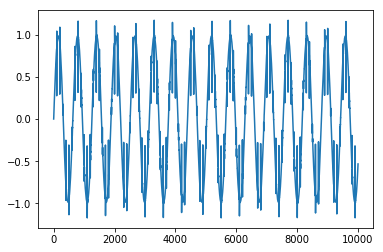

In [19]:
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    for i in range(1000):
        _, _loss = sess.run([train_op, loss], feed_dict={signal: reshaped_sin, signal_next: reshaped_sin_next})
        if i%100 == 0:
            print('step: {}, loss: {}'.format(i, _loss))
        
    _pred = sess.run(out, feed_dict={signal: reshaped_sin})
    _reshaped_pred = np.reshape(_pred, [-1])
    plt.plot(_reshaped_pred)
    plt.show()
        